Clustering open responses in survey data
======================================================

- In this notebook we apply clustering to open responses in survey data with the help of Transformer modeling. The notebook is tailored to Finnish text data.
- [FSD3360 Helsingin Sanomat Loneliness Survey 2014](https://services.fsd.tuni.fi/catalogue/FSD3360?tab=description&lang=en&study_language=en) from the Finnish Social Data Archive is used as an example. The dataset is available for research, teaching and study.
- The data includes the following open-ended question: "Miltä yksinäisyys tuntuu? Yksinäisyyteen liittyy usein voimakkaita tunteita, jotka ovat erilaisia eri elämäntilanteissa. Jos haluat, voit kertoa yksinäisyyskokemuksiasi tässä."
- In this notebook we
    1. install and import necessary libraries,
    2. preprocess loneliness data,
    3. perform principal component analysis (PCA) for feature reduction,
    4. use elbow or silhouette method for determining an appropriate amount of clusters,
    5. perform k-means clustering and visualize the results with t-distributed stochastic neighbor embedding (t-SNE),
    6. make wordclouds of clusters using lemmatized loneliness data.


# 1. Install and import libraries

If some libraries are not installed, use command prompt with e.g.
```
pip install sentence_transformers
```

In [ ]:
!pip install sentence_transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.3/163.3 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 37.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

In [ ]:
!pip install kneed

In [ ]:
!pip install kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.3 MB/s eta 0:00:00


In [ ]:
#hide warnings
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
from itertools import chain
import numpy as np
import string

import transformers
from transformers import AutoTokenizer

#sentence embedding
from sentence_transformers import SentenceTransformer

#Kmeans, tSNE, PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

#elbow method
from scipy.spatial.distance import cdist
from kneed import KneeLocator

#silhouette scores
from sklearn.metrics import silhouette_score

#wordcloud
from wordcloud import WordCloud, STOPWORDS

#plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

#n-grams
from collections import defaultdict

In [ ]:
#configuration with tokenizer, model and data folder indicated
#(change according to your use case)
class cfg():
    tokenizer_name = 'TurkuNLP/bert-base-finnish-cased-v1'
    model_name = 'TurkuNLP/sbert-cased-finnish-paraphrase'
    data_folder = "/content/Turku-neural-parser-pipeline/" #locally: "./Turku-neural-parser-pipeline/"
    example_case = False
    lemmatized_data_path = 'loneliness_data_lemmatized.csv'
    data_delimiter = ";"

# 2. Preprocessing data

- Download
[FSD3360 Helsingin Sanomat Loneliness Survey 2014](https://services.fsd.tuni.fi/catalogue/FSD3360?tab=description&lang=en&study_language=en) from the Finnish Social Data Archive.
- Choose two columns: identifier and the only open-ended question ("[q9] Miltä yksinäisyys tuntuu? Yksinäisyyteen liittyy usein voimakkaita tunteita, jotka ovat erilaisia eri elämäntilanteissa. Jos haluat, voit kertoa yksinäisyyskokemuksiasi tässä.") for the task.

In [ ]:
#check and print the amount of duplicate and nan values in a dataframe
def check_dupl_nan(df):
    print('NaNs: ',df.isna().sum())
    for i in df.columns:
        print('Duplicates in {0}: {1}'.format(i,df[i].duplicated().sum()))

#remove duplicate and nan values in a dataframe
#nan values in nan_columns, duplicate values in dupl_columns
def remove_dupl_nan(df, nan_columns=['text'], dupl_columns=['text']):
    df = df.dropna(subset=nan_columns)
    df = df.drop_duplicates(subset=dupl_columns)
    df = df.reset_index(drop=True)
    return df

#check the length of data samples (each row in dataframe)
#length is calculated from tokenized form of text data (samples)
def check_token_length(df, print_lengths=True):
    tokenizer = AutoTokenizer.from_pretrained(cfg.tokenizer_name)
    x = df["text"].values

    # Encode our concatenated data
    encoded = [tokenizer.encode(sent, add_special_tokens=True) for sent in x]

    # Find the maximum, minimum, mean and median length
    t_lengths=[len(sent) for sent in encoded]
    max_len = max(t_lengths)
    mean_len = np.mean(t_lengths)
    median_len = np.median(t_lengths)
    min_len = min(t_lengths)

    if print_lengths:
        print('Min length: ', min_len)
        print('Mean length: ', mean_len)
        print('Median length: ', median_len)
        print('Max length: ', max_len)

    return min_len, median_len, mean_len, max_len

In [ ]:
data = pd.read_csv('./daF3360.csv', delimiter=cfg.data_delimiter)
data = data[["q9", "fsd_id"]]
data = data.rename({'q9': 'text', 'fsd_id': 'id'}, axis=1)
data

,text,id
0,,1
1,,2
2,vois vetää ranteet auki tai mennä metsään ja h...,3
3,,4
4,kakalta,5
...,...,...
27846,Pakko pärjätä yksin,27847
27847,,27848
27848,,27849
27849,Nolla(0) ystävää miksi pitää valita että muka ...,27850


Let's check the amount of duplicate and NaN values.

In [ ]:
check_dupl_nan(data)

NaNs:  text    0
id      0
dtype: int64
Duplicates in text: 24679
Duplicates in id: 0


We can see that there's empty rows, so we turn them into NAN values for further processing.

In [ ]:
# replace field that's entirely space (or empty) with NaN using regex
data = data.replace(r'^\s*$', np.nan, regex=True)
data

,text,id
0,NaN,1
1,NaN,2
2,vois vetää ranteet auki tai mennä metsään ja h...,3
3,NaN,4
4,kakalta,5
...,...,...
27846,Pakko pärjätä yksin,27847
27847,NaN,27848
27848,NaN,27849
27849,Nolla(0) ystävää miksi pitää valita että muka ...,27850


Drop duplicates and NaN values.

In [ ]:
data = remove_dupl_nan(data, nan_columns=['text'], dupl_columns=['text'])
data

,text,id
0,vois vetää ranteet auki tai mennä metsään ja h...,3
1,kakalta,5
2,"liian yksinäistä, ollakseen yksi näistä.",10
3,Ei miltään,11
4,Pahalta. Joka päivä ainoat mielessä pyörivät a...,13
...,...,...
3166,"Olen nykyisessä elämäntilanteessani harvoin, j...",27839
3167,"Alakuloa, haikeutta, turhautuneisuutta",27846
3168,Pakko pärjätä yksin,27847
3169,Nolla(0) ystävää miksi pitää valita että muka ...,27850


Check if there's duplicate or NaN values left. Print also a few metrics about token lengths (data samples sizes, i.e. how long each row is).

In [ ]:
check_dupl_nan(data)
_ = check_token_length(data)

NaNs:  text    0
id      0
dtype: int64
Duplicates in text: 0
Duplicates in id: 0


Token indices sequence length is longer than the specified maximum sequence length for this model (533 > 512). Running this sequence through the model will result in indexing errors


Min length:  3
Mean length:  41.59539577420372
Median length:  25.0
Max length:  824


In [ ]:
if cfg.example_case == True:
  data=data[:200]
  display(data)

,text,id
0,vois vetää ranteet auki tai mennä metsään ja h...,3
1,kakalta,5
2,"liian yksinäistä, ollakseen yksi näistä.",10
3,Ei miltään,11
4,Pahalta. Joka päivä ainoat mielessä pyörivät a...,13
...,...,...
195,vvituttaa masentaa oksetta,1500
196,"Tuntuu siltä, ettei kuuluisi perheeseen, jota ...",1528
197,"Kukaan tuskin pitää minua yksinäisenä, sillä e...",1562
198,toivottomalta,1569


Additionally, save the preprocessed dataframe as csv file.

In [ ]:
data.to_csv(cfg.data_folder+'loneliness_data_processed.csv', index = False)

# 3. Lemmatization of data


We recommend using [Turku Neural Parser](https://turkunlp.org/Turku-neural-parser-pipeline/) for the lemmatization of text data. You can lemmatize by running the lemmatization code in Colab, or installing Turku Neural Parser locally.


## 3.1 In Colab

How to install earlier versions of python (e.g., py3.7.9 as in this notebook) in Colab:
 https://github.com/googlecolab/colabtools/issues/3266

In [ ]:
%env PYTHONPATH = # /env/python

env: PYTHONPATH=# /env/python


In [ ]:
# installing virtual environment using conda (package manager)
# miniconda for saving space

#Miniconda versions for other python versions:
#https://repo.anaconda.com/miniconda/

!wget https://repo.anaconda.com/miniconda/Miniconda3-py37_4.9.2-Linux-x86_64.sh
!chmod +x Miniconda3-py37_4.9.2-Linux-x86_64.sh
!./Miniconda3-py37_4.9.2-Linux-x86_64.sh -b -f -p /usr/local
!yes | conda update conda

--2024-04-04 18:11:49--  https://repo.anaconda.com/miniconda/Miniconda3-py37_4.9.2-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.131.3, 104.16.130.3, 2606:4700::6810:8303, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.131.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90040905 (86M) [application/x-sh]
Saving to: ‘Miniconda3-py37_4.9.2-Linux-x86_64.sh’

Miniconda3-py37_4.9 100%[===================>]  85.87M   212MB/s    in 0.4s    

2024-04-04 18:11:49 (212 MB/s) - ‘Miniconda3-py37_4.9.2-Linux-x86_64.sh’ saved [90040905/90040905]

PREFIX=/usr/local
Unpacking payload ...
Solving environment: / - \ done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - _libgcc_mutex==0.1=main
    - brotlipy==0.7.0=py37h27cfd23_1003
    - ca-certificates==2020.10.14=0
    - certifi==2020.6.20=pyhd3eb1b0_3
    - cffi==1.14.3=py37h261ae71_2
    - chardet==3.0.4=py37h06a4308_1003
    - conda-p

In [ ]:
# adding the correct path of python packages for the Python interpreter to search for modules
import sys
sys.path.append('/usr/local/lib/python3.7/site-packages')

In [ ]:
#create an environment called "myenv" for python 3.7.9
!yes | conda create -n myenv python=3.7.9

Solving environment: | failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: - \ | / done


==> WARNING: A newer version of conda exists. <==
  current version: 4.9.2
  latest version: 24.3.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /usr/local/envs/myenv

  added / updated specs:
    - python=3.7.9


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2022.12.7          |   py37h06a4308_0         150 KB
    pip-22.3.1                 |   py37h06a4308_0         2.7 MB
    setuptools-65.6.3          |   py37h06a4308_0         1.1 MB
    wheel-0.38.4               |   py37h06a4308_0          63 KB
    ------------------------------------------------------------
                                           Total:         4.0 MB

The following N

In [ ]:
#let's do an additional check to see if we have the correct python version
!python3 --version #3.7.9?

Python 3.7.9


We use shell sessions and commands during the lemmatization. Everytime we'd like to utilize the previously created environment, we need to activate it.

At first we will clone the github repository for Turku neural parser pipeline. Then we will install necessary packages for the parser to work. Then we can fetch the model for conducting the lemmatization. Finally, we will use the script "lemmatization.py" to lemmatize a dataset. To run lemmatization.py we use full paths of the input and output files, and the format of the command is
```console
python3 /path/to/script /path/to/input /path/to/output
```
so the command will look like this:
```console
python3 /content/Turku-neural-parser-pipeline/lemmatization.py /content/Turku-neural-parser-pipeline/loneliness_data_processed.csv /content/Turku-neural-parser-pipeline/loneliness_data_lemmatized.csv
```

In [ ]:
%%shell
eval "$(conda shell.bash hook)"
conda activate myenv
git clone https://github.com/TurkuNLP/Turku-neural-parser-pipeline.git
cd Turku-neural-parser-pipeline

Cloning into 'Turku-neural-parser-pipeline'...
remote: Enumerating objects: 1309, done.
remote: Counting objects: 100% (350/350), done.
remote: Compressing objects: 100% (169/169), done.
remote: Total 1309 (delta 206), reused 304 (delta 180), pack-reused 959
Receiving objects: 100% (1309/1309), 385.80 KiB | 2.17 MiB/s, done.
Resolving deltas: 100% (764/764), done.


In [ ]:
# %%shell
# eval "$(conda shell.bash hook)"
# conda activate myenv
%%shell
eval "$(conda shell.bash hook)"
conda activate myenv
python3 -m pip install ufal.udpipe configargparse transformers "OpenNMT-py>=1.2.0" "git+https://github.com/TurkuNLP/diaparser.git@master" "pytorch_lightning<1.5.0" "torchmetrics<=0.7.3"
pip3 install "torchmetrics<=0.7.3"
pip3 install six
pip3 install OpenNMT-py==2.1.0 #>=1.2.0
pip3 install scikit-learn #>=0.24
pip3 install tqdm==4.62.3
pip3 install pandas==1.3.5

  Cloning https://github.com/TurkuNLP/diaparser.git (to revision master) to /tmp/pip-req-build-86m0svsc
  Running command git clone --filter=blob:none --quiet https://github.com/TurkuNLP/diaparser.git /tmp/pip-req-build-86m0svsc
  Resolved https://github.com/TurkuNLP/diaparser.git to commit 7b8fab02a7a78efcc7a6072b3ed7588a7d881d0b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 936.6/936.6 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 91.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.6/219.6 kB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 925.8/925.8 kB 60.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.2/398.2 kB 41.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.

In [ ]:
%%shell
eval "$(conda shell.bash hook)"
conda activate myenv
cd /content/Turku-neural-parser-pipeline/
pwd
python3 fetch_models.py fi_tdt_dia

/content/Turku-neural-parser-pipeline


In [ ]:
# # Check if the packages are installed to correct place
# %%shell
# eval "$(conda shell.bash hook)"
# conda activate myenv
# pip3 list -v

**Remember to have necessary files into Turku-neural-parser-pipeline -folder! For example, "lemmatization.py" and "loneliness_data_processed.csv".**

In [ ]:
# input_data =  '/content/Turku-neural-parser-pipeline/loneliness_data_processed.csv'
# output_data = '/content/Turku-neural-parser-pipeline/loneliness_data_lemmatized.csv'

In [ ]:
%%shell
eval "$(conda shell.bash hook)"
conda activate myenv
cd /content/Turku-neural-parser-pipeline/
pwd
python3 /content/Turku-neural-parser-pipeline/lemmatization.py /content/Turku-neural-parser-pipeline/loneliness_data_processed.csv /content/Turku-neural-parser-pipeline/loneliness_data_lemmatized.csv

/content/Turku-neural-parser-pipeline
['parse_plaintext', 'tag_plaintext', 'parse_sentlines', 'parse_wslines', 'parse_conllu', 'tokenize', 'parse_noisytext']
/usr/local/envs/myenv/lib/python3.7/site-packages/pytorch_lightning/core/decorators.py:66: LightningDeprecationWarning: The `@auto_move_data` decorator is deprecated in v1.3 and will be removed in v1.5. Please use `trainer.predict` instead for inference. The decorator was applied to `predict`
  "The `@auto_move_data` decorator is deprecated in v1.3 and will be removed in v1.5."
INFO:root:Loading model from /content/Turku-neural-parser-pipeline/models_fi_tdt_dia/Tagger/best.ckpt
/usr/local/envs/myenv/lib/python3.7/site-packages/sklearn/base.py:338: UserWarning: Trying to unpickle estimator LabelEncoder from version 0.24.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintaina

## 3.2 With local installation


Check installation guide for [Turku neural parser pipeline](https://turkunlp.org/Turku-neural-parser-pipeline/).
It includes, e.g., the following commands:
```console
git clone https://github.com/TurkuNLP/Turku-neural-parser-pipeline.git
cd Turku-neural-parser-pipeline
python3 -m venv venv-tnpp
source venv-tnpp/bin/activate
python3 -m pip install --upgrade pip
python3 -m pip install --upgrade setuptools
python3 -m pip install -r requirements.txt
python3 fetch_models.py fi_tdt_dia
```

In [ ]:
import pandas as pd
import re
from tqdm import tqdm
from tnparser.pipeline import read_pipelines, Pipeline

In [ ]:
def get_lemmas_from_parsed(sent):
    parsed = p.parse(sent)
    parsed_split = parsed.split("\n")
    lemmas = []
    for i in parsed_split:
        if '\t' in i:
            parsed_more = i.split("\t")
            lemmas.append(parsed_more[2])
    return lemmas

In [ ]:
df = pd.read_csv(cfg.data_folder+'loneliness_data_processed.csv')
df

In [ ]:
# insert your model name here (model-name/pipelines.yaml)
available_pipelines = read_pipelines("./Turku-neural-parser-pipeline/models_fi_tdt_dia/pipelines.yaml")

# print available pipelines for your model
print(list(available_pipelines.keys()))

In [ ]:
p = Pipeline(available_pipelines["parse_plaintext"])

From TurkuNLP's website: "A neural parsing pipeline for segmentation, morphological tagging, dependency parsing and lemmatization with pre-trained models for more than 50 languages."

In [ ]:
txt_in = "Minulla on söpö koira. Se haukkuu, syö makkaraa, jahtaa oravia ja tsillailee kanssani!"
parsed = p.parse(txt_in)
print(parsed)

In [ ]:
tqdm.pandas()
df["lemma"] = df["text"].progress_apply(get_lemmas_from_parsed)

In [ ]:
df.to_csv(cfg.data_folder+cfg.lemmatized_data_path, index=False)

# 4. K-means clustering and t-SNE visualization


## Sentence embeddings

We produce sentence embeddings with Sentence Transformer model to transform the data from textual into vectoral form. After creating sentence embeddings, principal component analysis (PCA) is applied to sentence embeddings for feature reduction.

See more information on [Sentence Transformers training overview](https://www.sbert.net/docs/training/overview.html)). The model used here is developed by the [TurkuNLP research group](https://huggingface.co/TurkuNLP/sbert-cased-finnish-paraphrase).

## Elbow or silhouette method?

We use elbow method to determine the right amount of clusters. We do this by first running k-means with many different k values, and then plotting the results. With the example data we can see the top of elbow being 12. It might be useful to check multiple different k values since we deal with sentence embeddings. Instead of elbow method silhouette method can also be used for determining k.

We perform k-means with k clusters once more, and add the cluster numbers to each data row.

## Visualizing with t-SNE

T-distributed Stochastic Neighbor Embedding, or t-SNE, is calculated for sentence embeddings. t-SNE can be used for high-dimensional data visualization. [Quoting the documentation for t-SNE](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html):

> t-SNE [...] converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data.

In [ ]:
from ast import literal_eval
import plotly.express as px
from PIL import Image

def single_tsne_image(X_embedded, df, file_name="tsne_visual", fig_title=""):
    df_embeddings = pd.DataFrame(X_embedded)
    df_embeddings = df_embeddings.rename(columns={0:'x',1:'y'})
    df_embeddings = df_embeddings.assign(cluster=df.cluster2.values)
    df_embeddings = df_embeddings.assign(text=df['text'].values)
    fig = px.scatter(
        df_embeddings, x='x', y='y',
        color='cluster', labels={'color': 'cluster'},
        hover_data=['text'],
        title = fig_title)
    fig.show()
    #fig.write_image(file_name+".png")

def elbow_method(X_reduced, n_clusters_checked=40):
  distortions = []
  K = range(2, n_clusters_checked)
  for k in K:
      k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced)
      k_means.fit(X_reduced)
      distortions.append(sum(np.min(cdist(X_reduced, k_means.cluster_centers_, 'euclidean'), axis=1)) / X_reduced.shape[0])

  # Find the elbow point using the KneeLocator
  kneedle = KneeLocator(K, distortions, curve='convex', direction='decreasing')
  elbow_point = kneedle.elbow

  # Create a line plot
  plt.figure(figsize=(10, 6))
  plt.plot(K, distortions, marker='o', linestyle='-', color='b')
  plt.xlabel('k')
  plt.ylabel('Distortion')
  plt.title('Elbow methods for choosing k')

  # Add a red line indicating the elbow point
  plt.axvline(x=elbow_point, color='r', linestyle='--', label=f'Elbow point: k={elbow_point}')
  plt.legend()

  plt.show()
  return elbow_point

def silhouette_method(X_reduced, n_clusters_checked=20):
  range_n_clusters=np.arange(2, n_clusters_checked)
  all_preds=[]
  all_scores=[]
  for n_clusters in range_n_clusters:
      clusterer = KMeans(n_clusters=n_clusters)
      preds = clusterer.fit_predict(X_reduced)
      all_preds.append(preds)
      centers = clusterer.cluster_centers_

      score = silhouette_score(X_reduced, preds)
      all_scores.append(score)
      print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))
  return np.argmax(all_scores)

In [ ]:
def create_clusters(lemmatized_data_path, use_elbow=True, use_silhouette=False):
  # load the lemmatized dataset
  df = pd.read_csv(lemmatized_data_path)#, converters={'lemma': pd.eval})
  # use pd.eval or literal_eval for making sure pandas loads the lemma column with correct type (list)
  df['lemma2'] = df['lemma'].apply(literal_eval)

  # load the model
  model = SentenceTransformer(cfg.model_name)
  sentences = df.text
  sentence_embeddings = model.encode(sentences)
  print(f"Shape of sentence embeddings: {sentence_embeddings.shape}")

  # dimension reduction
  pca = PCA(n_components=0.9, random_state=42)
  X_reduced = pca.fit_transform(sentence_embeddings)
  print(f"Shape of sentence embeddings after PCA: {X_reduced.shape}")

  # using silhouette or elbow method for determining number of clusters
  no_of_clusters=0
  if use_silhouette:
    no_of_clusters=silhouette_method(X_reduced)

  if use_elbow:
    no_of_clusters=elbow_method(X_reduced)

  # computing k-means
  kmeans = KMeans(n_clusters=no_of_clusters, random_state=42)
  y_pred = kmeans.fit_predict(X_reduced)
  df['cluster'] = y_pred
  df['cluster2'] = y_pred+1

  # using t-sNE for visualization
  # note that the perplexity value should be smaller than the amount of data samples
  tsne = TSNE(verbose=1, perplexity=100, random_state=42, n_iter=1000)
  X_embedded = tsne.fit_transform(X_reduced)
  single_tsne_image(X_embedded, df, file_name="tsnevisual", fig_title="TSNE")

  return df

modules.json:   0%|          | 0.00/230 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/118 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.87k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/498M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/353 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/424k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/3.00 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Shape of sentence embeddings: (3171, 768)
Shape of sentence embeddings after PCA: (3171, 101)


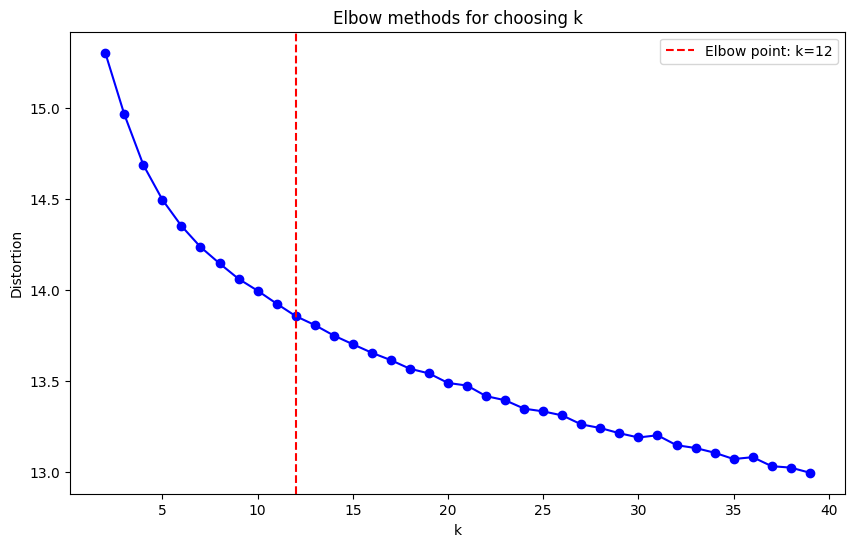

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 3171 samples in 0.002s...
[t-SNE] Computed neighbors for 3171 samples in 0.426s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3171
[t-SNE] Computed conditional probabilities for sample 2000 / 3171
[t-SNE] Computed conditional probabilities for sample 3000 / 3171
[t-SNE] Computed conditional probabilities for sample 3171 / 3171
[t-SNE] Mean sigma: 5.535312
[t-SNE] KL divergence after 100 iterations with early exaggeration: 67.609512
[t-SNE] KL divergence after 1000 iterations: 1.752181


In [ ]:
df = create_clusters(cfg.data_folder+'loneliness_data_lemmatized.csv', use_elbow=True, use_silhouette=False)

# 5. Wordclouds

In [ ]:
#processing samples in dataframe by lowercasing and removing stopwords and punctuations
def process_lemmatized_text(df, lemma_column="lemma2"):
    df["processed_text"] = ""
    for i in range(len(df)):
        df_row = [ j.lower().strip() for j in df[lemma_column][i]]
        df_row = [ word for word in df_row if word not in stopwords and word not in punctuations ]
        df_row = " ".join([i for i in df_row])
        df.loc[i,"processed_text"] = df_row

#checking the amount of samples in each cluster
def number_of_samples_in_clusters(df):
    print("Checking the amount of samples in clusters.")
    for j in sorted(df.cluster2.unique()):
        print(f"In cluster {j} there's {len(df[df.cluster2==j])} data samples.")

#plotting the wordclouds for each cluster
def create_wordclouds_for_clusters(df, cluster_column="cluster"):
    no_clusters = max(df[cluster_column].unique())+1

    for i in range(no_clusters):
        mpl.rcParams["figure.figsize"] = (20, 30)
        wordcloud = WordCloud(background_color="black", width = 1200, height = 700).generate(" ".join(x for x in df["processed_text"].loc[df[cluster_column] == i].values))
        plt.axis("off")
        plt.title(f"CLUSTER {i+1}", fontsize = 20)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.show()

Finnish stopword list ("stopwords-fi.txt") is fetched from [here](https://github.com/stopwords-iso/stopwords-fi). We load and use it as a stopword list. Punctuations are needed as well.

In [ ]:
stopwords = pd.read_csv('stopwords-fi.txt', header=0, names=['word'])
stopwords = list(stopwords['word'])
print(stopwords[:10]) #10 word example of stopwords

punctuations = string.punctuation + str("'´€â“")
print(punctuations)

['aika', 'aikaa', 'aikaan', 'aikaisemmin', 'aikaisin', 'aikajen', 'aikana', 'aikoina', 'aikoo', 'aikovat']
!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~'´€â“


We process the lemmatized text (in column 'lemma'), to have it in a more appropriate form when creating word clouds.

In [ ]:
process_lemmatized_text(df)
df

,text,id,lemma,lemma2,cluster,cluster2,processed_text
0,vois vetää ranteet auki tai mennä metsään ja h...,3,"['voida', 'vetää', 'ranne', 'auki', 'tai', 'me...","[voida, vetää, ranne, auki, tai, mennä, metsä,...",3,4,voida vetää ranne auki mennä metsä hirtäytyä p...
1,kakalta,5,['kakka'],[kakka],10,11,kakka
2,"liian yksinäistä, ollakseen yksi näistä.",10,"['liian', 'yksinäinen', ',', 'olla', 'yksi', '...","[liian, yksinäinen, ,, olla, yksi, tämä, .]",9,10,yksinäinen
3,Ei miltään,11,"['ei', 'mikään']","[ei, mikään]",10,11,
4,Pahalta. Joka päivä ainoat mielessä pyörivät a...,13,"['paha', '.', 'joka', 'päivä', 'ainoa', 'mieli...","[paha, ., joka, päivä, ainoa, mieli, pyöriä, a...",5,6,paha päivä mieli pyöriä itse#murha katkeruus v...
...,...,...,...,...,...,...,...
3166,"Olen nykyisessä elämäntilanteessani harvoin, j...",27839,"['olla', 'nykyinen', 'elämän#tilanne', 'harvoi...","[olla, nykyinen, elämän#tilanne, harvoin, ,, j...",8,9,nykyinen elämän#tilanne harvoin yksinäinen työ...
3167,"Alakuloa, haikeutta, turhautuneisuutta",27846,"['ala#kulo', ',', 'haikeus', ',', 'turhautunei...","[ala#kulo, ,, haikeus, ,, turhautuneisuus]",5,6,ala#kulo haikeus turhautuneisuus
3168,Pakko pärjätä yksin,27847,"['pakko', 'pärjätä', 'yksin']","[pakko, pärjätä, yksin]",9,10,pakko pärjätä
3169,Nolla(0) ystävää miksi pitää valita että muka ...,27850,"['no', '(', '0', ')', 'ystävä', 'miksi', 'pitä...","[no, (, 0, ), ystävä, miksi, pitää, valita, et...",8,9,no 0 ystävä pitää valita huvi ystävä


Printing the number of data samples (dataframe rows) in each cluster.

In [ ]:
number_of_samples_in_clusters(df)

Checking the amount of samples in clusters.
In cluster 1 there's 214 data samples.
In cluster 2 there's 373 data samples.
In cluster 3 there's 286 data samples.
In cluster 4 there's 351 data samples.
In cluster 5 there's 104 data samples.
In cluster 6 there's 268 data samples.
In cluster 7 there's 338 data samples.
In cluster 8 there's 108 data samples.
In cluster 9 there's 262 data samples.
In cluster 10 there's 253 data samples.
In cluster 11 there's 341 data samples.
In cluster 12 there's 273 data samples.


Creating word clouds for each cluster. The bigger words in the wordcloud indicate a word that is more used in the text belonging to the cluster. Consequently, smaller words are less used in the text present in the cluster. The words are in lemmatized form (at least for the most part).

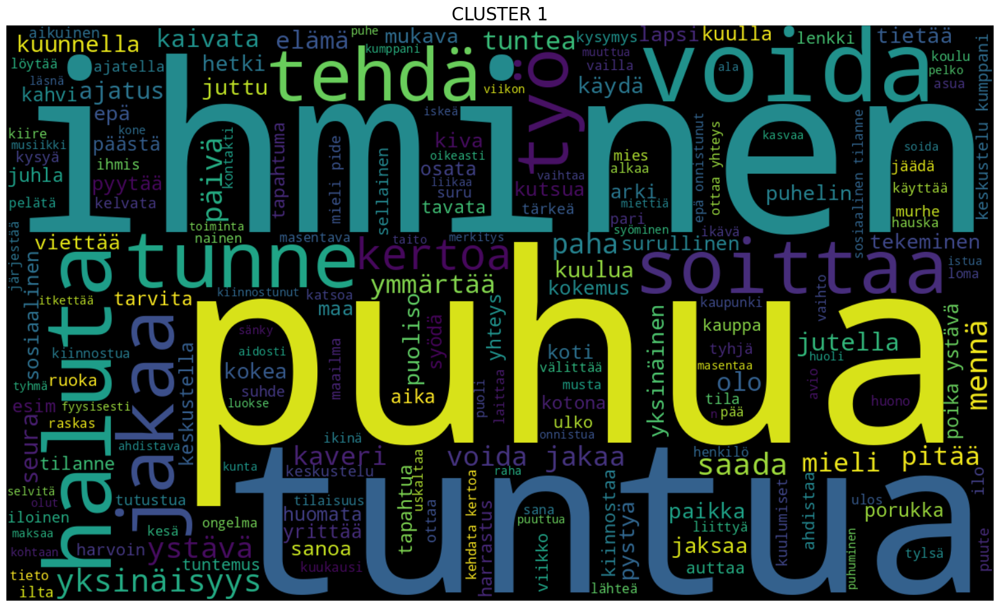

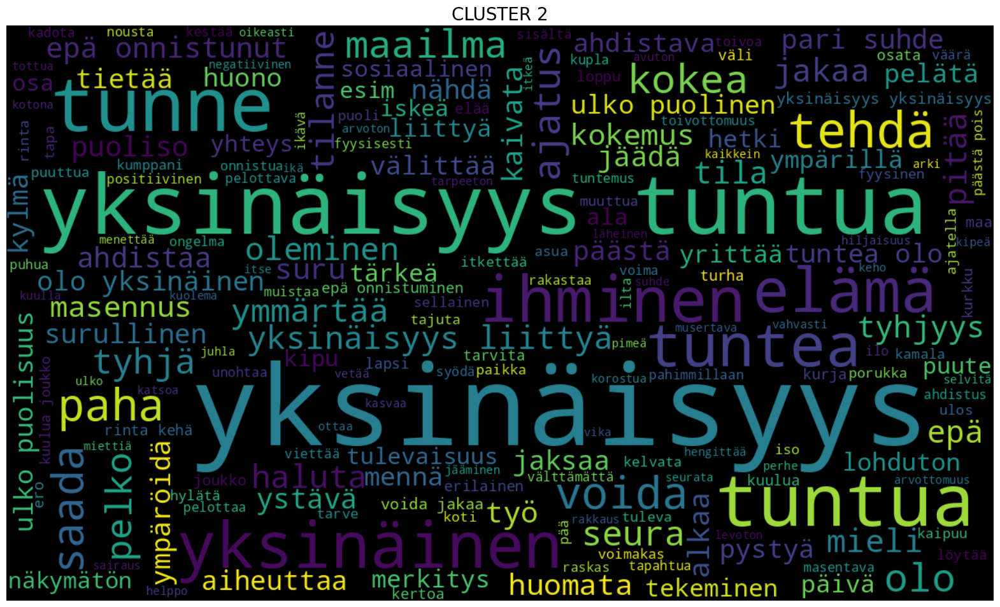

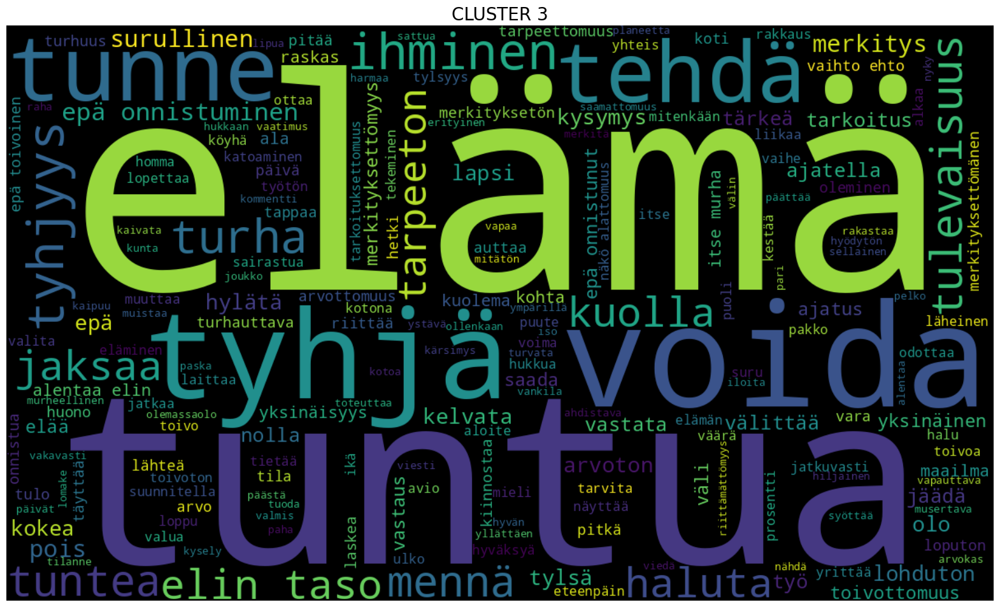

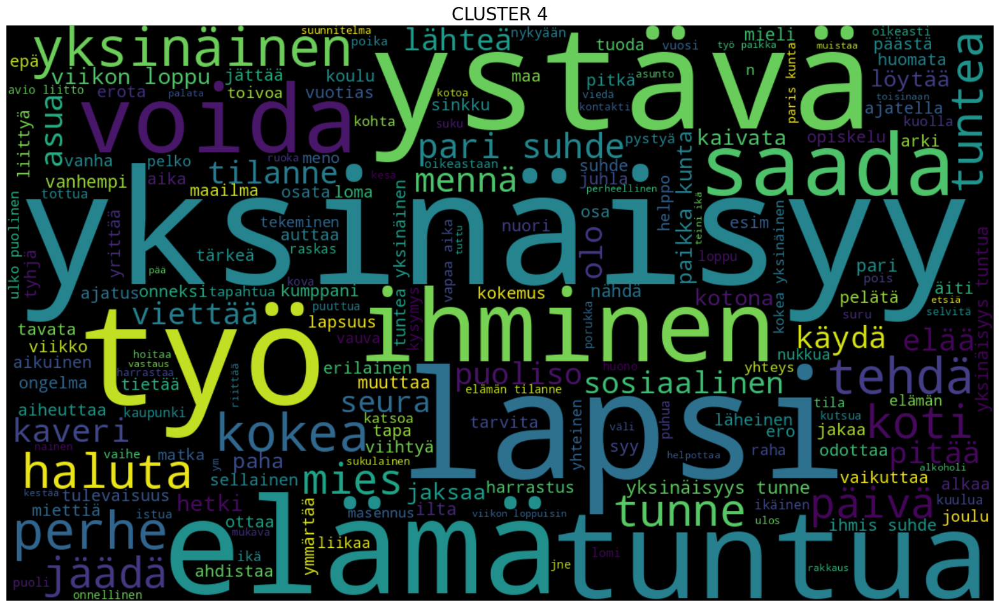

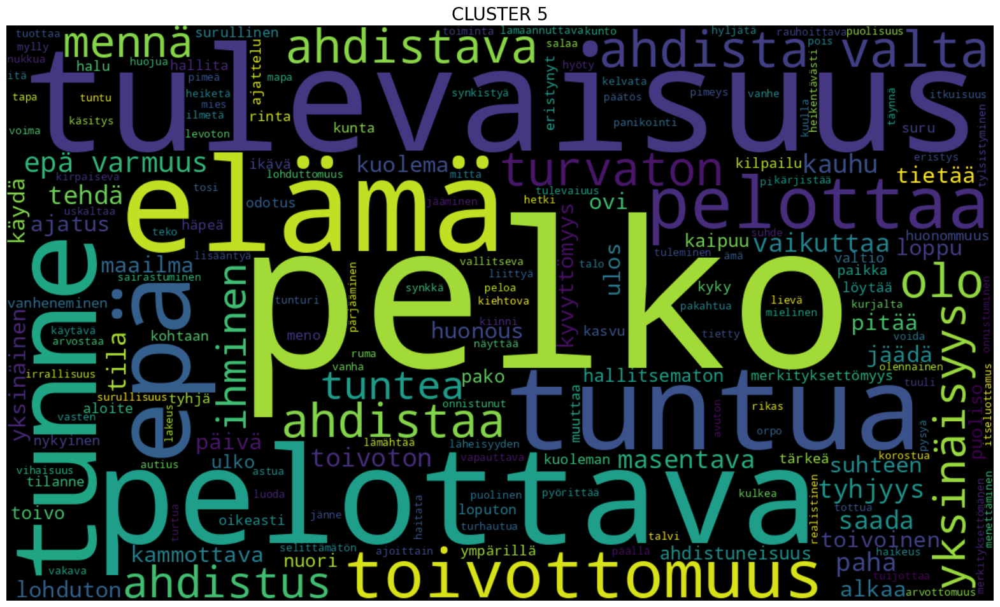

...

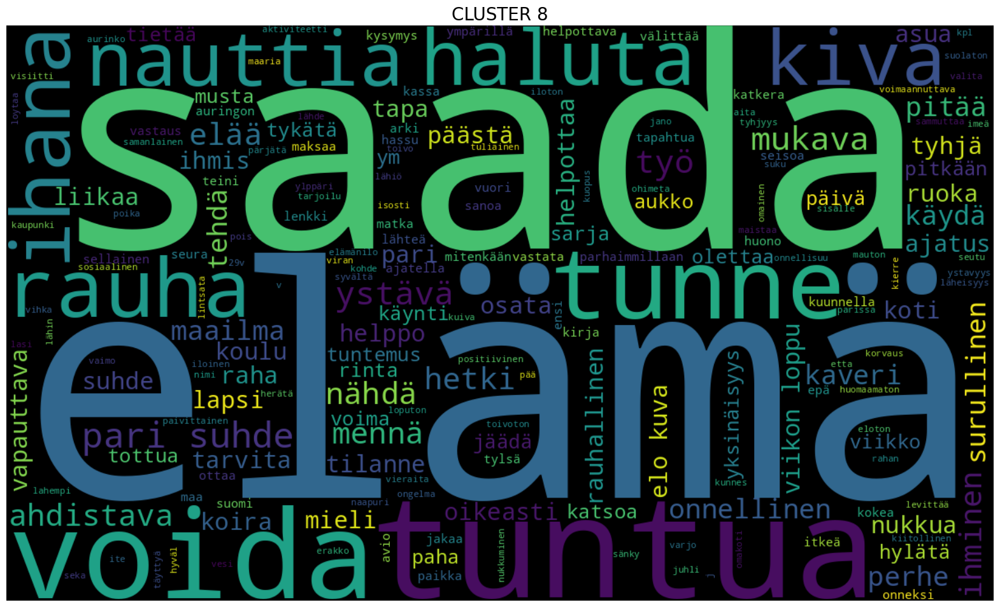

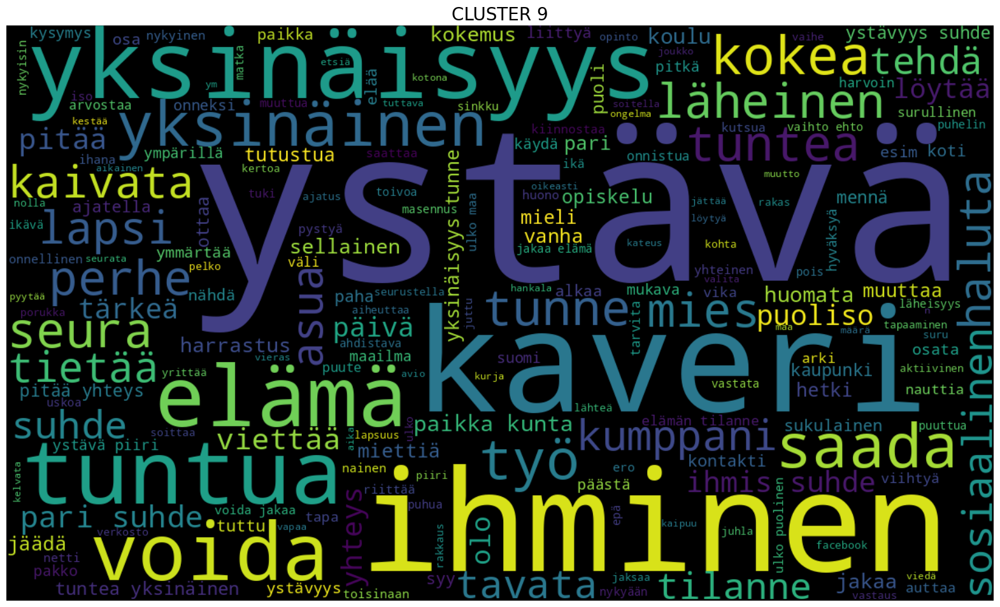

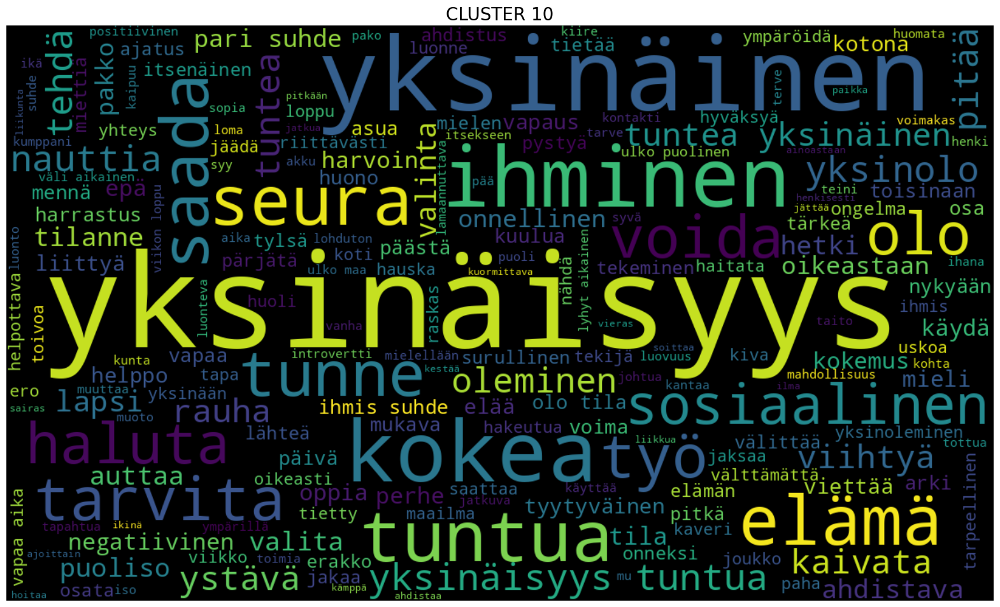

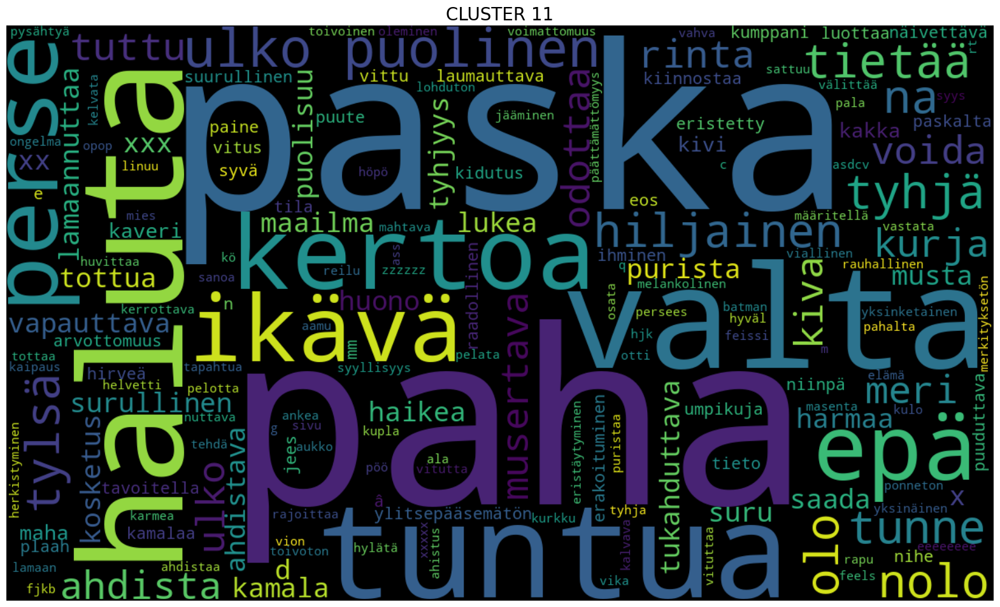

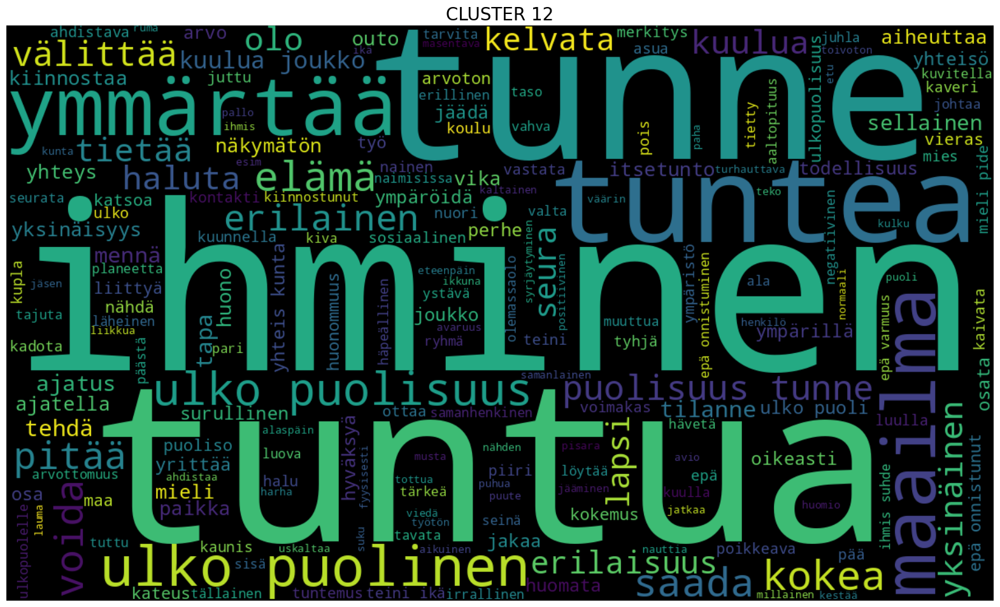

In [ ]:
create_wordclouds_for_clusters(df)